Установка необходимых библиотек

In [85]:
# Зеркало Tsinghua University
!pip install torch torchvision numpy matplotlib \
  -i https://pypi.tuna.tsinghua.edu.cn/simple \
  --default-timeout=100

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple



[notice] A new release of pip is available: 25.3 -> 26.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Импорты, seed и устройство

In [86]:

# Импорт стандартных библиотек Python
import os       # Работа с файловой системой (пути, каталоги)
import json     # Сериализация/десериализация JSON (сохранение конфигов)
import csv      # Запись таблиц в CSV-формат (runs.csv)
import copy     # Глубокое копирование объектов (сохранение state_dict)
import random   # Генератор случайных чисел (фиксация seed)
import time     # Измерение времени выполнения экспериментов

# Импорт сторонних библиотек
import numpy as np                    # Многомерные массивы и математика
import matplotlib.pyplot as plt       # Построение графиков и визуализация
import matplotlib.patches as mpatches # Рисование прямоугольников на графиках
import torch                          # Фреймворк глубокого обучения
import torch.nn as nn                 # Модули нейронных сетей
import torch.nn.functional as F       # Функции активации, пулинг и т.п.
import torchvision                    # Модели, датасеты, трансформации для CV
import torchvision.transforms as transforms  # Преобразования изображений
import torchvision.models as models   # Готовые предобученные модели
from torchvision import datasets      # Стандартные датасеты (STL10, VOC и др.)
from torch.utils.data import DataLoader, Subset  # Загрузчики данных

# Печатаем версии для воспроизводимости
print(f"PyTorch: {torch.__version__}")
print(f"Torchvision: {torchvision.__version__}")
print(f"NumPy: {np.__version__}")

PyTorch: 2.10.0+cpu
Torchvision: 0.25.0+cpu
NumPy: 2.3.3


Утилиты: seed, устройство, каталоги

In [87]:
#  ВОСПРОИЗВОДИМОСТЬ

def set_seed(seed: int = 42) -> None:
    """
    Фиксирует все источники случайности для воспроизводимости экспериментов.

    Что фиксируется:
      • random — стандартная библиотека Python
      • numpy — генератор NumPy
      • torch — генератор PyTorch (CPU)
      • cuda — генератор PyTorch (GPU), если доступен
      • cudnn — режим «детерминированных» свёрточных ядер
    """
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)

    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)

    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

    print(f"[seed] Seed зафиксирован: {seed}")


def get_device() -> torch.device:
    """Определяет доступное вычислительное устройство."""
    if torch.cuda.is_available():
        device = torch.device("cuda")
        gpu_name = torch.cuda.get_device_name(0)
        print(f"[device] CUDA ({gpu_name})")
    else:
        device = torch.device("cpu")
        print("[device] CPU")
    return device


def ensure_dirs() -> dict:
    """Создаёт каталоги для данных и артефактов."""
    data_dir = os.path.join(".", "data")
    artifacts_dir = os.path.join(".", "artifacts")
    figures_dir = os.path.join(artifacts_dir, "figures")

    for d in (data_dir, artifacts_dir, figures_dir):
        os.makedirs(d, exist_ok=True)

    paths = {"data": data_dir, "artifacts": artifacts_dir, "figures": figures_dir}
    print(f"[dirs] Каталоги готовы: {list(paths.keys())}")
    return paths

In [88]:
# Инициализация: seed + устройство + каталоги
SEED = 42
set_seed(SEED)

device = get_device()

dirs = ensure_dirs()
DATA_DIR = dirs['data']
ARTIFACTS_DIR = dirs['artifacts']
FIGURES_DIR = dirs['figures']

[seed] Seed зафиксирован: 42
[device] CPU
[dirs] Каталоги готовы: ['data', 'artifacts', 'figures']


Функции обучения и оценки

In [89]:
def train_one_epoch(model, loader, criterion, optimizer, device):
    """
    Выполняет один полный проход (эпоху) обучения по DataLoader.
    Возвращает (avg_loss, accuracy).
    """
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in loader:
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)
        _, predicted = outputs.max(1)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()

    avg_loss = running_loss / total
    accuracy = correct / total
    return avg_loss, accuracy


def evaluate(model, loader, criterion, device):
    """Оценивает модель без обновления весов."""
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            running_loss += loss.item() * images.size(0)
            _, predicted = outputs.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()

    avg_loss = running_loss / total
    accuracy = correct / total
    return avg_loss, accuracy

In [90]:
def run_experiment(experiment_id, model, train_loader, val_loader, device,
                   epochs=5, lr=1e-3, optimizer_cls=None):
    """
    Полный цикл обучения: N эпох с логированием loss и accuracy.
    Возвращает dict с историей и best_state_dict.
    """
    if optimizer_cls is None:
        optimizer_cls = torch.optim.Adam

    trainable_params = filter(lambda p: p.requires_grad, model.parameters())
    optimizer = optimizer_cls(trainable_params, lr=lr)
    criterion = nn.CrossEntropyLoss()

    history = {"train_loss": [], "val_loss": [], "train_acc": [], "val_acc": []}
    best_val_acc = 0.0
    best_epoch = 0
    best_state_dict = None

    n_trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f"Эксперимент: {experiment_id}")
    print(f"Эпох: {epochs}, LR: {lr}, Оптимизатор: {optimizer_cls.__name__}")
    print(f"Обучаемых параметров: {n_trainable:,}")

    for epoch in range(1, epochs + 1):
        t0 = time.time()

        train_loss, train_acc = train_one_epoch(
            model, train_loader, criterion, optimizer, device)
        val_loss, val_acc = evaluate(
            model, val_loader, criterion, device)

        elapsed = time.time() - t0

        history["train_loss"].append(train_loss)
        history["val_loss"].append(val_loss)
        history["train_acc"].append(train_acc)
        history["val_acc"].append(val_acc)

        if val_acc > best_val_acc:
            best_val_acc = val_acc
            best_epoch = epoch
            best_state_dict = copy.deepcopy(model.state_dict())

        marker = " *" if val_acc >= best_val_acc else ""
        print(f"Эпоха {epoch}/{epochs}  "
              f"train_loss={train_loss:.4f} train_acc={train_acc:.4f}  "
              f"val_loss={val_loss:.4f} val_acc={val_acc:.4f}  "
              f"[{elapsed:.1f}s]{marker}")

    history["best_val_acc"] = best_val_acc
    history["best_epoch"] = best_epoch
    history["best_state_dict"] = best_state_dict

    print(f"\nЛучшая val_acc = {best_val_acc:.4f} (эпоха {best_epoch})")
    return history

In [91]:
def plot_history(history, title="", save_path=None):
    """Графики train/val loss и accuracy по эпохам."""
    epochs_range = range(1, len(history["train_loss"]) + 1)
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

    ax1.plot(epochs_range, history["train_loss"], "o-", label="Train Loss")
    ax1.plot(epochs_range, history["val_loss"], "s-", label="Val Loss")
    ax1.set_xlabel("Эпоха"); ax1.set_ylabel("Loss")
    ax1.set_title("Loss по эпохам"); ax1.legend(); ax1.grid(True, alpha=0.3)

    ax2.plot(epochs_range, history["train_acc"], "o-", label="Train Acc")
    ax2.plot(epochs_range, history["val_acc"], "s-", label="Val Acc")
    ax2.set_xlabel("Эпоха"); ax2.set_ylabel("Accuracy")
    ax2.set_title("Accuracy по эпохам"); ax2.legend(); ax2.grid(True, alpha=0.3)

    if title:
        fig.suptitle(title, fontsize=14, fontweight='bold', y=1.02)
    plt.tight_layout()

    if save_path:
        os.makedirs(os.path.dirname(save_path), exist_ok=True)
        fig.savefig(save_path, dpi=150, bbox_inches='tight')
        print(f"График сохранён: {save_path}")
    plt.show()


def save_history_csv(history, experiment_id, save_path):
    """Сохраняет историю обучения в CSV."""
    os.makedirs(os.path.dirname(save_path), exist_ok=True)
    n_epochs = len(history["train_loss"])
    with open(save_path, "w", newline="", encoding="utf-8") as f:
        writer = csv.writer(f)
        writer.writerow(["experiment_id", "epoch",
                         "train_loss", "val_loss", "train_acc", "val_acc"])
        for i in range(n_epochs):
            writer.writerow([
                experiment_id, i + 1,
                f"{history['train_loss'][i]:.6f}",
                f"{history['val_loss'][i]:.6f}",
                f"{history['train_acc'][i]:.6f}",
                f"{history['val_acc'][i]:.6f}",
            ])
    print(f"История сохранена: {save_path}")

Архитектуры моделей (SimpleCNN, ResNet18)

In [92]:
class SimpleCNN(nn.Module):
    """
    Простая CNN для классификации: 3 свёрточных блока + классификатор.
    Conv→BN→ReLU→Pool × 3, затем AdaptiveAvgPool(4,4)→Flatten→256→Dropout→10.
    """

    def __init__(self, num_classes=10):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)
        self.bn1   = nn.BatchNorm2d(32)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.bn2   = nn.BatchNorm2d(64)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.bn3   = nn.BatchNorm2d(128)
        self.pool = nn.AdaptiveAvgPool2d((4, 4))
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(128 * 4 * 4, 256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, num_classes),
        )

    def forward(self, x):
        x = F.max_pool2d(F.relu(self.bn1(self.conv1(x))), 2)
        x = F.max_pool2d(F.relu(self.bn2(self.conv2(x))), 2)
        x = self.pool(F.relu(self.bn3(self.conv3(x))))
        x = self.classifier(x)
        return x

In [93]:
def build_resnet18_head(num_classes=10, device=None):
    """ResNet18: backbone заморожен, обучается только fc."""
    model = models.resnet18(weights="IMAGENET1K_V1")
    for param in model.parameters():
        param.requires_grad = False
    in_features = model.fc.in_features
    model.fc = nn.Linear(in_features, num_classes)
    if device is not None:
        model = model.to(device)
    trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
    total = sum(p.numel() for p in model.parameters())
    print(f"ResNet18 head-only: обучаемых {trainable:,} / всего {total:,} "
          f"({100*trainable/total:.1f}%)")
    return model


def build_resnet18_ft(num_classes=10, device=None):
    """ResNet18: layer4 + fc разморожены."""
    model = models.resnet18(weights="IMAGENET1K_V1")
    for param in model.parameters():
        param.requires_grad = False
    for param in model.layer4.parameters():
        param.requires_grad = True
    in_features = model.fc.in_features
    model.fc = nn.Linear(in_features, num_classes)
    if device is not None:
        model = model.to(device)
    trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
    total = sum(p.numel() for p in model.parameters())
    print(f"ResNet18 fine-tune (layer4+fc): обучаемых {trainable:,} / "
          f"всего {total:,} ({100*trainable/total:.1f}%)")
    return model

Функции детекции (Часть B)

In [94]:
# Классы Pascal VOC (20)
VOC_CLASSES = [
    "aeroplane", "bicycle", "bird", "boat", "bottle",
    "bus", "car", "cat", "chair", "cow",
    "diningtable", "dog", "horse", "motorbike", "person",
    "pottedplant", "sheep", "sofa", "train", "tvmonitor",
]

# COCO-классы (91) — Faster R-CNN предобучена на COCO
COCO_CLASSES = [
    "__background__", "person", "bicycle", "car", "motorcycle", "airplane",
    "bus", "train", "truck", "boat", "traffic light", "fire hydrant",
    "N/A", "stop sign", "parking meter", "bench", "bird", "cat", "dog",
    "horse", "sheep", "cow", "elephant", "bear", "zebra", "giraffe", "N/A",
    "backpack", "umbrella", "N/A", "N/A", "handbag", "tie", "suitcase",
    "frisbee", "skis", "snowboard", "sports ball", "kite", "baseball bat",
    "baseball glove", "skateboard", "surfboard", "tennis racket", "bottle",
    "N/A", "wine glass", "cup", "fork", "knife", "spoon", "bowl", "banana",
    "apple", "sandwich", "orange", "broccoli", "carrot", "hot dog", "pizza",
    "donut", "cake", "chair", "couch", "potted plant", "bed", "N/A",
    "dining table", "N/A", "N/A", "toilet", "N/A", "tv", "laptop", "mouse",
    "remote", "keyboard", "cell phone", "microwave", "oven", "toaster",
    "sink", "refrigerator", "N/A", "book", "clock", "vase", "scissors",
    "teddy bear", "hair drier", "toothbrush",
]

# Маппинг COCO → VOC
COCO_TO_VOC = {
    "person": "person", "bicycle": "bicycle", "car": "car",
    "motorcycle": "motorbike", "airplane": "aeroplane", "bus": "bus",
    "train": "train", "boat": "boat", "bird": "bird", "cat": "cat",
    "dog": "dog", "horse": "horse", "sheep": "sheep", "cow": "cow",
    "bottle": "bottle", "chair": "chair", "couch": "sofa",
    "potted plant": "pottedplant", "dining table": "diningtable",
    "tv": "tvmonitor",
}

In [95]:
def parse_voc_target(target):
    """Извлекает объекты из XML-разметки VOC."""
    result = []
    annotation = target.get("annotation", {})
    objects = annotation.get("object", [])
    if isinstance(objects, dict):
        objects = [objects]
    for obj in objects:
        label = obj.get("name", "unknown")
        bndbox = obj.get("bndbox", {})
        bbox = [
            float(bndbox.get("xmin", 0)),
            float(bndbox.get("ymin", 0)),
            float(bndbox.get("xmax", 0)),
            float(bndbox.get("ymax", 0)),
        ]
        result.append({"label": label, "bbox": bbox})
    return result


def compute_iou(box_a, box_b):
    """IoU (Intersection over Union) между двумя bounding boxes."""
    x1 = max(box_a[0], box_b[0])
    y1 = max(box_a[1], box_b[1])
    x2 = min(box_a[2], box_b[2])
    y2 = min(box_a[3], box_b[3])
    inter_area = max(0, x2 - x1) * max(0, y2 - y1)
    area_a = (box_a[2] - box_a[0]) * (box_a[3] - box_a[1])
    area_b = (box_b[2] - box_b[0]) * (box_b[3] - box_b[1])
    union_area = area_a + area_b - inter_area
    if union_area <= 0:
        return 0.0
    return inter_area / union_area


def match_predictions(pred_boxes, pred_labels, gt_boxes, gt_labels, iou_thresh=0.5):
    """Жадное сопоставление предсказаний с GT по IoU."""
    tp = 0
    fp = 0
    matched_ious = []
    matched_gt = set()

    for pred_box, pred_label in zip(pred_boxes, pred_labels):
        best_iou = 0.0
        best_gt_idx = -1
        for j, (gt_box, gt_label) in enumerate(zip(gt_boxes, gt_labels)):
            if j in matched_gt:
                continue
            iou = compute_iou(pred_box, gt_box)
            if iou > best_iou:
                best_iou = iou
                best_gt_idx = j
        if best_iou >= iou_thresh and best_gt_idx >= 0:
            tp += 1
            matched_gt.add(best_gt_idx)
            matched_ious.append(best_iou)
        else:
            fp += 1

    fn = len(gt_boxes) - len(matched_gt)
    return {"tp": tp, "fp": fp, "fn": fn, "ious": matched_ious}

In [96]:
def run_detection(model, dataset, device, score_threshold=0.5, max_images=50):
    """Инференс детектора на наборе изображений."""
    model.eval()
    results = []
    n = min(max_images, len(dataset))
    to_tensor = transforms.ToTensor()

    print(f"Инференс: {n} изображений, порог = {score_threshold} ...")

    for idx in range(n):
        img_pil, target = dataset[idx]
        img_tensor = img_pil if isinstance(img_pil, torch.Tensor) else to_tensor(img_pil)
        img_batch = img_tensor.unsqueeze(0).to(device)

        with torch.no_grad():
            predictions = model(img_batch)

        pred = predictions[0]
        boxes  = pred["boxes"].cpu().numpy()
        labels = pred["labels"].cpu().numpy()
        scores = pred["scores"].cpu().numpy()

        mask = scores >= score_threshold
        boxes, labels, scores = boxes[mask], labels[mask], scores[mask]

        pred_boxes_voc, pred_labels_voc, pred_scores_voc = [], [], []
        for box, lbl, score in zip(boxes, labels, scores):
            if lbl < len(COCO_CLASSES):
                coco_name = COCO_CLASSES[lbl]
            else:
                continue
            voc_name = COCO_TO_VOC.get(coco_name)
            if voc_name is not None:
                pred_boxes_voc.append(box.tolist())
                pred_labels_voc.append(voc_name)
                pred_scores_voc.append(float(score))

        gt_objects = parse_voc_target(target)
        gt_boxes  = [obj["bbox"] for obj in gt_objects]
        gt_labels = [obj["label"] for obj in gt_objects]

        results.append({
            "pred_boxes": pred_boxes_voc, "pred_labels": pred_labels_voc,
            "pred_scores": pred_scores_voc,
            "gt_boxes": gt_boxes, "gt_labels": gt_labels,
            "image": img_tensor,
        })

        if (idx + 1) % 10 == 0:
            print(f"  ... обработано {idx + 1}/{n}")

    print(f"Инференс завершён. Обработано {n} изображений.")
    return results


def compute_det_metrics(results, iou_thresh=0.5):
    """Precision, recall, mean_iou по всем изображениям."""
    total_tp = total_fp = total_fn = 0
    all_ious = []

    for r in results:
        m = match_predictions(
            r["pred_boxes"], r["pred_labels"],
            r["gt_boxes"],   r["gt_labels"],
            iou_thresh=iou_thresh)
        total_tp += m["tp"]
        total_fp += m["fp"]
        total_fn += m["fn"]
        all_ious.extend(m["ious"])

    precision = total_tp / (total_tp + total_fp) if (total_tp + total_fp) > 0 else 0.0
    recall = total_tp / (total_tp + total_fn) if (total_tp + total_fn) > 0 else 0.0
    mean_iou = float(np.mean(all_ious)) if all_ious else 0.0

    metrics = {"precision": precision, "recall": recall, "mean_iou": mean_iou,
               "tp": total_tp, "fp": total_fp, "fn": total_fn}

    print(f"Метрики (IoU≥{iou_thresh}): TP={total_tp}, FP={total_fp}, FN={total_fn}")
    print(f"Precision = {precision:.4f}, Recall = {recall:.4f}, Mean IoU = {mean_iou:.4f}")
    return metrics

In [97]:
def visualize_detections(results, num_images=4, save_path=None,
                         title="Результаты детекции"):
    """Показывает изображения с предсказанными (зелёные) и GT (красные) боксами."""
    n = min(num_images, len(results))
    cols = 2
    rows = (n + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(7 * cols, 6 * rows))
    if n == 1:
        axes = np.array([axes])
    axes = np.array(axes).flatten()

    for i in range(n):
        ax = axes[i]
        r = results[i]
        img_np = r["image"].permute(1, 2, 0).cpu().numpy()
        img_np = np.clip(img_np, 0, 1)
        ax.imshow(img_np)

        for box, label in zip(r["gt_boxes"], r["gt_labels"]):
            x1, y1, x2, y2 = box
            rect = mpatches.FancyBboxPatch(
                (x1, y1), x2 - x1, y2 - y1,
                linewidth=2, edgecolor="red", facecolor="none",
                boxstyle="square,pad=0")
            ax.add_patch(rect)
            ax.text(x1, y1 - 4, label, color="red", fontsize=7,
                    fontweight="bold", backgroundcolor="white")

        for box, label, score in zip(
                r["pred_boxes"], r["pred_labels"], r["pred_scores"]):
            x1, y1, x2, y2 = box
            rect = mpatches.FancyBboxPatch(
                (x1, y1), x2 - x1, y2 - y1,
                linewidth=2, edgecolor="lime", facecolor="none",
                boxstyle="square,pad=0")
            ax.add_patch(rect)
            ax.text(x1, y2 + 12, f"{label} {score:.2f}", color="lime",
                    fontsize=7, fontweight="bold", backgroundcolor="black")

        ax.set_title(f"Pred: {len(r['pred_boxes'])} | GT: {len(r['gt_boxes'])}")
        ax.axis("off")

    for i in range(n, len(axes)):
        axes[i].axis("off")

    fig.suptitle(title, fontsize=14, fontweight="bold")
    plt.tight_layout()

    if save_path:
        os.makedirs(os.path.dirname(save_path), exist_ok=True)
        fig.savefig(save_path, dpi=150, bbox_inches='tight')
        print(f"Визуализация сохранена: {save_path}")
    plt.show()


def plot_detection_metrics(metrics_v1, metrics_v2, save_path=None):
    """Столбчатая диаграмма сравнения precision/recall/mean_iou для V1 и V2."""
    metric_names = ["Precision", "Recall", "Mean IoU"]
    v1_vals = [metrics_v1["precision"], metrics_v1["recall"], metrics_v1["mean_iou"]]
    v2_vals = [metrics_v2["precision"], metrics_v2["recall"], metrics_v2["mean_iou"]]

    x = np.arange(len(metric_names))
    width = 0.3

    fig, ax = plt.subplots(figsize=(8, 5))
    bars1 = ax.bar(x - width / 2, v1_vals, width, label="V1 (порог 0.3)",
                   color="steelblue", alpha=0.8)
    bars2 = ax.bar(x + width / 2, v2_vals, width, label="V2 (порог 0.7)",
                   color="darkorange", alpha=0.8)

    for bar in bars1:
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.01,
                f"{bar.get_height():.3f}", ha="center", va="bottom", fontsize=9)
    for bar in bars2:
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.01,
                f"{bar.get_height():.3f}", ha="center", va="bottom", fontsize=9)

    ax.set_ylabel("Значение метрики")
    ax.set_title("Сравнение метрик детекции: V1 vs V2", fontweight="bold")
    ax.set_xticks(x); ax.set_xticklabels(metric_names)
    ax.set_ylim(0, 1.15); ax.legend(); ax.grid(axis="y", alpha=0.3)
    plt.tight_layout()

    if save_path:
        os.makedirs(os.path.dirname(save_path), exist_ok=True)
        fig.savefig(save_path, dpi=150, bbox_inches='tight')
        print(f"График метрик сохранён: {save_path}")
    plt.show()

Часть A – Загрузка данных STL10

In [98]:
# Гиперпараметры для части A
BATCH_SIZE  = 32   # Размер батча
NUM_WORKERS = 0    # Потоков загрузки (0 — безопасно для Windows)
NUM_EPOCHS  = 5    # Количество эпох
NUM_CLASSES = 10   # Количество классов STL10

print(f"BATCH_SIZE={BATCH_SIZE}, NUM_WORKERS={NUM_WORKERS}, "
      f"NUM_EPOCHS={NUM_EPOCHS}, NUM_CLASSES={NUM_CLASSES}")

BATCH_SIZE=32, NUM_WORKERS=0, NUM_EPOCHS=5, NUM_CLASSES=10


In [99]:
# Загрузка STL10: 96×96 цветных изображений, 10 классов
base_transform = transforms.Compose([transforms.ToTensor()])

stl10_train_full = datasets.STL10(
    root=DATA_DIR, split='train', download=True, transform=base_transform)
stl10_test = datasets.STL10(
    root=DATA_DIR, split='test', download=True, transform=base_transform)

print(f"Train (полный): {len(stl10_train_full)} изображений")
print(f"Test: {len(stl10_test)} изображений")
print(f"Классы: {stl10_train_full.classes}")

Train (полный): 5000 изображений
Test: 8000 изображений
Классы: ['airplane', 'bird', 'car', 'cat', 'deer', 'dog', 'horse', 'monkey', 'ship', 'truck']


In [100]:
# Разделение train → train / val (80% / 20%)
TRAIN_RATIO = 0.8
all_indices = list(range(len(stl10_train_full)))
random.shuffle(all_indices)
split_idx = int(TRAIN_RATIO * len(stl10_train_full))

train_indices = all_indices[:split_idx]
val_indices   = all_indices[split_idx:]

print(f"Train: {len(train_indices)} ({len(train_indices)/len(stl10_train_full)*100:.0f}%)")
print(f"Val: {len(val_indices)} ({len(val_indices)/len(stl10_train_full)*100:.0f}%)")
print(f"Test: {len(stl10_test)}")

Train: 4000 (80%)
Val: 1000 (20%)
Test: 8000


Transforms для части A

In [101]:
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]

# C1: только нормализация
transform_base = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])

# C2: + аугментации (flip, rotation, color jitter)
transform_aug = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=10),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.1),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])

# C3/C4 train: ResNet18 + ImageNet-нормализация (64×64 для экономии)
transform_resnet_train = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.Resize(72),
    transforms.RandomCrop(64),
    transforms.ToTensor(),
    transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD),
])

# C3/C4 val/test: детерминированный ресайз
transform_resnet_val = transforms.Compose([
    transforms.Resize(72),
    transforms.CenterCrop(64),
    transforms.ToTensor(),
    transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD),
])

print("Transforms определены")

Transforms определены


Визуализация аугментаций + sanity check

Сохранено: .\artifacts\figures\augmentations_preview.png


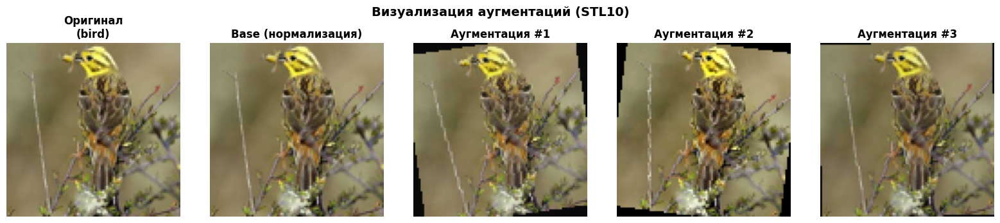

In [102]:
stl10_raw = datasets.STL10(root=DATA_DIR, split='train', download=False, transform=None)
raw_img, raw_label = stl10_raw[0]

def tensor_to_display(tensor):
    img = tensor.permute(1, 2, 0).numpy()
    img = img * 0.5 + 0.5
    return np.clip(img, 0, 1)

fig, axes = plt.subplots(1, 5, figsize=(16, 3.5))
axes[0].imshow(raw_img)
axes[0].set_title(f'Оригинал\n({stl10_raw.classes[raw_label]})', fontweight='bold')
axes[0].axis('off')

img_base = transform_base(raw_img)
axes[1].imshow(tensor_to_display(img_base))
axes[1].set_title('Base (нормализация)', fontweight='bold')
axes[1].axis('off')

for i in range(3):
    img_aug = transform_aug(raw_img)
    axes[2 + i].imshow(tensor_to_display(img_aug))
    axes[2 + i].set_title(f'Аугментация #{i+1}', fontweight='bold')
    axes[2 + i].axis('off')

plt.suptitle('Визуализация аугментаций (STL10)', fontsize=14, fontweight='bold')
plt.tight_layout()
aug_path = os.path.join(FIGURES_DIR, 'augmentations_preview.png')
fig.savefig(aug_path, dpi=150, bbox_inches='tight')
print(f'Сохранено: {aug_path}')
plt.show()

x.shape=torch.Size([32, 3, 96, 96]), y.shape=torch.Size([32])
x.dtype=torch.float32, y.dtype=torch.int64
x min=0.0000, x max=1.0000
Метки: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]


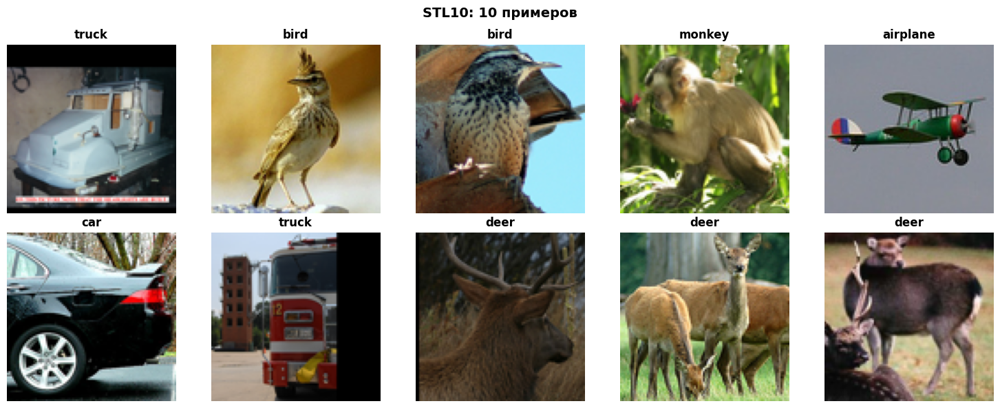

In [103]:
# Sanity check
_check_loader = DataLoader(
    Subset(stl10_train_full, train_indices),
    batch_size=BATCH_SIZE, shuffle=False, num_workers=0)

x_batch, y_batch = next(iter(_check_loader))
print(f'x.shape={x_batch.shape}, y.shape={y_batch.shape}')
print(f'x.dtype={x_batch.dtype}, y.dtype={y_batch.dtype}')
print(f'x min={x_batch.min():.4f}, x max={x_batch.max():.4f}')
print(f'Метки: {sorted(y_batch.unique().tolist())}')

fig, axes = plt.subplots(2, 5, figsize=(15, 6))
for i, ax in enumerate(axes.flatten()):
    img = x_batch[i].permute(1, 2, 0).numpy()
    ax.imshow(np.clip(img, 0, 1))
    ax.set_title(stl10_train_full.classes[y_batch[i]], fontweight='bold')
    ax.axis('off')
plt.suptitle('STL10: 10 примеров', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

Вспомогательная функция: DataLoader с нужным transform

In [104]:
def make_loaders(train_tf, val_tf):
    """Создаёт train и val DataLoader с указанными transforms."""
    ds_train = datasets.STL10(root=DATA_DIR, split='train',
                              download=False, transform=train_tf)
    ds_val = datasets.STL10(root=DATA_DIR, split='train',
                              download=False, transform=val_tf)

    train_loader = DataLoader(
        Subset(ds_train, train_indices), batch_size=BATCH_SIZE,
        shuffle=True, num_workers=NUM_WORKERS,
        pin_memory=torch.cuda.is_available())
    val_loader = DataLoader(
        Subset(ds_val, val_indices), batch_size=BATCH_SIZE,
        shuffle=False, num_workers=NUM_WORKERS,
        pin_memory=torch.cuda.is_available())
    return train_loader, val_loader

print('make_loaders() определена')

make_loaders() определена


Эксперимент C1: простая CNN без аугментаций

In [105]:
set_seed(SEED)
train_loader_c1, val_loader_c1 = make_loaders(transform_base, transform_base)
model_c1 = SimpleCNN(num_classes=NUM_CLASSES).to(device)

history_c1 = run_experiment(
    'C1', model_c1, train_loader_c1, val_loader_c1,
    device, epochs=NUM_EPOCHS, lr=1e-3)

[seed] Seed зафиксирован: 42
Эксперимент: C1
Эпох: 5, LR: 0.001, Оптимизатор: Adam
Обучаемых параметров: 620,810
Эпоха 1/5  train_loss=1.7045 train_acc=0.3523  val_loss=1.3660 val_acc=0.5120  [44.1s] *
Эпоха 2/5  train_loss=1.4117 train_acc=0.4773  val_loss=1.3364 val_acc=0.4810  [45.1s]
Эпоха 3/5  train_loss=1.2848 train_acc=0.5255  val_loss=1.1874 val_acc=0.5620  [49.6s] *
Эпоха 4/5  train_loss=1.1791 train_acc=0.5675  val_loss=1.1262 val_acc=0.5750  [47.6s] *
Эпоха 5/5  train_loss=1.0870 train_acc=0.6008  val_loss=1.2186 val_acc=0.5570  [47.6s]

Лучшая val_acc = 0.5750 (эпоха 4)


Эксперимент C2: простая CNN с аугментациями

In [106]:
set_seed(SEED)
train_loader_c2, val_loader_c2 = make_loaders(transform_aug, transform_base)
model_c2 = SimpleCNN(num_classes=NUM_CLASSES).to(device)

history_c2 = run_experiment(
    'C2', model_c2, train_loader_c2, val_loader_c2,
    device, epochs=NUM_EPOCHS, lr=1e-3)

[seed] Seed зафиксирован: 42
Эксперимент: C2
Эпох: 5, LR: 0.001, Оптимизатор: Adam
Обучаемых параметров: 620,810
Эпоха 1/5  train_loss=1.7751 train_acc=0.3255  val_loss=1.3770 val_acc=0.4890  [53.0s] *
Эпоха 2/5  train_loss=1.4979 train_acc=0.4303  val_loss=1.5176 val_acc=0.4460  [51.3s]
Эпоха 3/5  train_loss=1.3844 train_acc=0.4790  val_loss=1.2397 val_acc=0.5440  [52.2s] *
Эпоха 4/5  train_loss=1.2932 train_acc=0.5098  val_loss=1.2346 val_acc=0.5490  [50.8s] *
Эпоха 5/5  train_loss=1.2281 train_acc=0.5423  val_loss=1.2118 val_acc=0.5460  [56.3s]

Лучшая val_acc = 0.5490 (эпоха 4)


Эксперимент C3: ResNet18 — только голова

In [107]:
set_seed(SEED)
train_loader_c3, val_loader_c3 = make_loaders(transform_resnet_train, transform_resnet_val)
model_c3 = build_resnet18_head(num_classes=NUM_CLASSES, device=device)

history_c3 = run_experiment(
    'C3', model_c3, train_loader_c3, val_loader_c3,
    device, epochs=NUM_EPOCHS, lr=1e-2)

[seed] Seed зафиксирован: 42


ResNet18 head-only: обучаемых 5,130 / всего 11,181,642 (0.0%)
Эксперимент: C3
Эпох: 5, LR: 0.01, Оптимизатор: Adam
Обучаемых параметров: 5,130
Эпоха 1/5  train_loss=1.8371 train_acc=0.4910  val_loss=1.3508 val_acc=0.6310  [32.7s] *
Эпоха 2/5  train_loss=1.6318 train_acc=0.5657  val_loss=1.7724 val_acc=0.5850  [29.4s]
Эпоха 3/5  train_loss=1.5950 train_acc=0.5837  val_loss=1.6566 val_acc=0.6160  [31.1s]
Эпоха 4/5  train_loss=1.7791 train_acc=0.5747  val_loss=1.6072 val_acc=0.6090  [29.5s]
Эпоха 5/5  train_loss=1.5076 train_acc=0.6062  val_loss=1.6906 val_acc=0.6000  [28.4s]

Лучшая val_acc = 0.6310 (эпоха 1)


Эксперимент C4: ResNet18 — fine-tune (layer4 + fc)

In [108]:
set_seed(SEED)
train_loader_c4, val_loader_c4 = make_loaders(transform_resnet_train, transform_resnet_val)
model_c4 = build_resnet18_ft(num_classes=NUM_CLASSES, device=device)

history_c4 = run_experiment(
    'C4', model_c4, train_loader_c4, val_loader_c4,
    device, epochs=NUM_EPOCHS, lr=1e-3)

[seed] Seed зафиксирован: 42
ResNet18 fine-tune (layer4+fc): обучаемых 8,398,858 / всего 11,181,642 (75.1%)
Эксперимент: C4
Эпох: 5, LR: 0.001, Оптимизатор: Adam
Обучаемых параметров: 8,398,858
Эпоха 1/5  train_loss=1.0838 train_acc=0.6382  val_loss=0.8093 val_acc=0.7290  [51.4s] *
Эпоха 2/5  train_loss=0.6405 train_acc=0.7778  val_loss=0.6296 val_acc=0.7780  [51.6s] *
Эпоха 3/5  train_loss=0.5117 train_acc=0.8215  val_loss=0.6507 val_acc=0.7720  [54.2s]
Эпоха 4/5  train_loss=0.4440 train_acc=0.8445  val_loss=0.7359 val_acc=0.7670  [64.5s]
Эпоха 5/5  train_loss=0.3827 train_acc=0.8758  val_loss=0.6974 val_acc=0.7860  [62.9s] *

Лучшая val_acc = 0.7860 (эпоха 5)


Сравнение C1–C4 и выбор лучшей модели

Эксперимент               Best Val Acc   Best Epoch
──────────────────────────────────────────────────
C1 (CNN base)                   0.5750            4
C2 (CNN aug)                    0.5490            4
C3 (ResNet head)                0.6310            1
C4 (ResNet ft)                  0.7860            5
Сохранено: .\artifacts\figures\classification_compare.png


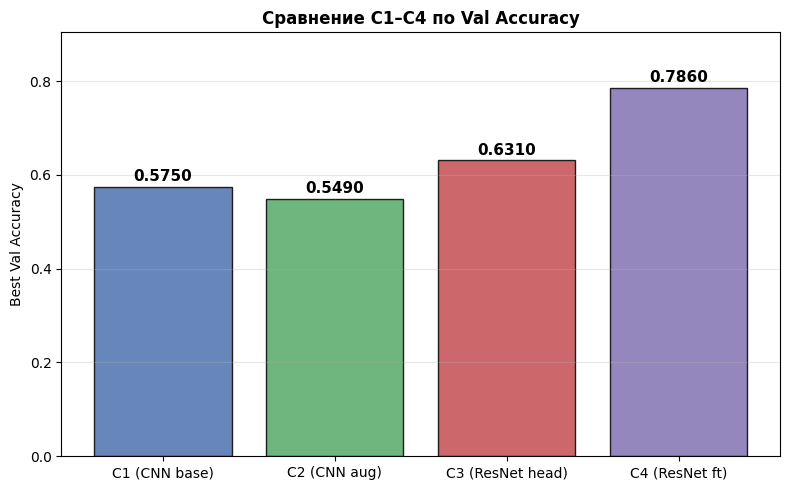

In [109]:
experiments = {
    'C1 (CNN base)':    history_c1,
    'C2 (CNN aug)':     history_c2,
    'C3 (ResNet head)': history_c3,
    'C4 (ResNet ft)':   history_c4,
}

print(f"{'Эксперимент':<25} {'Best Val Acc':>12} {'Best Epoch':>12}")
print('─' * 50)
for name, hist in experiments.items():
    print(f"{name:<25} {hist['best_val_acc']:>12.4f} {hist['best_epoch']:>12}")

fig, ax = plt.subplots(figsize=(8, 5))
names = list(experiments.keys())
accs  = [h['best_val_acc'] for h in experiments.values()]
colors = ['#4C72B0', '#55A868', '#C44E52', '#8172B2']
bars = ax.bar(names, accs, color=colors, alpha=0.85, edgecolor='black')
for bar, acc in zip(bars, accs):
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.005,
            f'{acc:.4f}', ha='center', va='bottom', fontsize=11, fontweight='bold')
ax.set_ylabel('Best Val Accuracy')
ax.set_title('Сравнение C1–C4 по Val Accuracy', fontweight='bold')
ax.set_ylim(0, max(accs) * 1.15)
ax.grid(axis='y', alpha=0.3)
plt.tight_layout()
compare_path = os.path.join(FIGURES_DIR, 'classification_compare.png')
fig.savefig(compare_path, dpi=150, bbox_inches='tight')
print(f'Сохранено: {compare_path}')
plt.show()

Лучший: C4 (ResNet ft), val_acc=0.7860
График сохранён: .\artifacts\figures\classification_curves_best.png


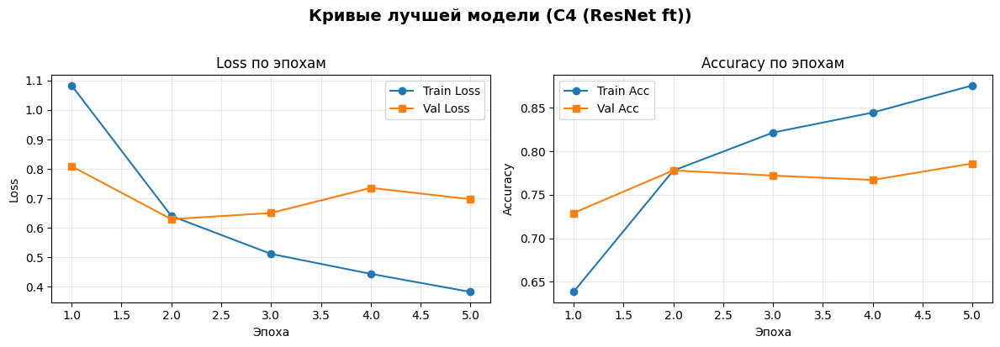

In [110]:
exp_map = {
    'C1': ('C1 (CNN base)',    history_c1, model_c1, val_loader_c1, transform_base),
    'C2': ('C2 (CNN aug)',     history_c2, model_c2, val_loader_c2, transform_base),
    'C3': ('C3 (ResNet head)', history_c3, model_c3, val_loader_c3, transform_resnet_val),
    'C4': ('C4 (ResNet ft)',   history_c4, model_c4, val_loader_c4, transform_resnet_val),
}

best_id = max(exp_map, key=lambda k: exp_map[k][1]['best_val_acc'])
best_name, best_hist, best_model, best_val_loader, best_test_tf = exp_map[best_id]

print(f'Лучший: {best_name}, val_acc={best_hist["best_val_acc"]:.4f}')
best_model.load_state_dict(best_hist['best_state_dict'])

curves_path = os.path.join(FIGURES_DIR, 'classification_curves_best.png')
plot_history(best_hist, title=f'Кривые лучшей модели ({best_name})',
             save_path=curves_path)

Финальная оценка лучшей модели на TEST

In [111]:
stl10_test_ds = datasets.STL10(
    root=DATA_DIR, split='test', download=False, transform=best_test_tf)
test_loader = DataLoader(
    stl10_test_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS)

criterion = nn.CrossEntropyLoss()
test_loss, test_acc = evaluate(best_model, test_loader, criterion, device)

print(f'Финальная оценка на TEST')
print(f'Модель: {best_name}')
print(f'Test Loss: {test_loss:.4f}')
print(f'Test Accuracy: {test_acc:.4f} ({test_acc*100:.2f}%)')

Финальная оценка на TEST
Модель: C4 (ResNet ft)
Test Loss: 0.7014
Test Accuracy: 0.7837 (78.38%)


Сохранение артефактов части A

In [112]:
# Веса лучшей модели
model_path = os.path.join(ARTIFACTS_DIR, 'best_classifier.pt')
torch.save(best_hist['best_state_dict'], model_path)
print(f'Модель: {model_path}')

# Конфигурация
config = {
    'experiment_id': best_id, 'dataset': 'STL10', 'num_classes': NUM_CLASSES,
    'architecture': best_name, 'optimizer': 'Adam',
    'lr': 1e-3 if best_id in ('C1', 'C2', 'C4') else 1e-2,
    'epochs': NUM_EPOCHS, 'best_epoch': best_hist['best_epoch'],
    'best_val_accuracy': best_hist['best_val_acc'],
    'test_accuracy': test_acc, 'seed': SEED,
    'batch_size': BATCH_SIZE, 'device': str(device),
    'train_size': len(train_indices), 'val_size': len(val_indices),
    'test_size': len(stl10_test),
}
config_path = os.path.join(ARTIFACTS_DIR, 'best_classifier_config.json')
with open(config_path, 'w', encoding='utf-8') as f:
    json.dump(config, f, ensure_ascii=False, indent=2)
print(f'Конфиг: {config_path}')

# Истории обучения
for exp_id, hist in [('C1', history_c1), ('C2', history_c2),
                     ('C3', history_c3), ('C4', history_c4)]:
    save_history_csv(hist, exp_id, os.path.join(ARTIFACTS_DIR, f'history_{exp_id}.csv'))

print('Артефакты части A сохранены')

Модель: .\artifacts\best_classifier.pt
Конфиг: .\artifacts\best_classifier_config.json
История сохранена: .\artifacts\history_C1.csv
История сохранена: .\artifacts\history_C2.csv
История сохранена: .\artifacts\history_C3.csv
История сохранена: .\artifacts\history_C4.csv
Артефакты части A сохранены


Часть B – Детекция: загрузка Pascal VOC 2007

In [113]:
import zipfile
import shutil

voc_dir = os.path.join(DATA_DIR, "VOCdevkit", "VOC2007")

if not os.path.isdir(voc_dir):
    local_zip = os.path.join(DATA_DIR, "pascal-voc-2007.zip")

    if not os.path.isfile(local_zip):
        raise FileNotFoundError(
            f"Архив не найден: {local_zip}\n"
            "Скачайте Pascal VOC 2007 с https://www.kaggle.com/datasets/zaraks/pascal-voc-2007\n"
            f"и сохраните как {local_zip}")

    print(f"Найден архив: {local_zip}")
    print("Распаковываем ...")
    with zipfile.ZipFile(local_zip, 'r') as zf:
        zf.extractall(DATA_DIR)
    print("Распаковка завершена.")

    # Kaggle-архив содержит 2 отдельных поддерева:
    #   VOCtest_06-Nov-2007/VOCdevkit/VOC2007/   (test split)
    #   VOCtrainval_06-Nov-2007/VOCdevkit/VOC2007/ (train+val split)
    # Объединяем их в единую data/VOCdevkit/VOC2007/

    src_dirs = [
        os.path.join(DATA_DIR, "VOCtrainval_06-Nov-2007", "VOCdevkit", "VOC2007"),
        os.path.join(DATA_DIR, "VOCtest_06-Nov-2007", "VOCdevkit", "VOC2007"),
    ]

    os.makedirs(voc_dir, exist_ok=True)

    for src_voc in src_dirs:
        if not os.path.isdir(src_voc):
            print(f" Пропускаем (не найдено): {src_voc}")
            continue
        print(f" Объединяем: {src_voc}")
        for item in os.listdir(src_voc):
            src_item = os.path.join(src_voc, item)
            dst_item = os.path.join(voc_dir, item)
            if os.path.isdir(src_item):
                # Файлы из подкаталогов (Annotations, JPEGImages, ImageSets/...)
                # копируем с объединением
                for root, dirs, files in os.walk(src_item):
                    rel = os.path.relpath(root, src_item)
                    dst_sub = os.path.join(dst_item, rel)
                    os.makedirs(dst_sub, exist_ok=True)
                    for f in files:
                        src_f = os.path.join(root, f)
                        dst_f = os.path.join(dst_sub, f)
                        if not os.path.exists(dst_f):
                            shutil.copy2(src_f, dst_f)
            else:
                if not os.path.exists(dst_item):
                    shutil.copy2(src_item, dst_item)

    # Удаляем промежуточные папки
    for name in ["VOCtrainval_06-Nov-2007", "VOCtest_06-Nov-2007", "PASCAL_VOC"]:
        tmp = os.path.join(DATA_DIR, name)
        if os.path.isdir(tmp):
            shutil.rmtree(tmp, ignore_errors=True)
    print("Промежуточные папки удалены.")

if not os.path.isdir(voc_dir):
    raise RuntimeError(f"Папка {voc_dir} не найдена. Проверьте структуру архива.")

# Проверяем наличие val.txt
val_txt = os.path.join(voc_dir, "ImageSets", "Main", "val.txt")
if not os.path.isfile(val_txt):
    raise FileNotFoundError(f"Файл {val_txt} не найден — возможно архив повреждён.")

voc_val = datasets.VOCDetection(
    root=DATA_DIR, year='2007', image_set='val',
    download=False, transform=transforms.ToTensor())

print(f'Pascal VOC 2007 val: {len(voc_val)} изображений')
print(f'Классы: {VOC_CLASSES}')

Pascal VOC 2007 val: 2510 изображений
Классы: ['aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor']


Image shape: torch.Size([3, 375, 500])
Объектов: 5
  1: "chair", bbox=[263.0, 211.0, 324.0, 339.0]
  2: "chair", bbox=[165.0, 264.0, 253.0, 372.0]
  3: "chair", bbox=[5.0, 244.0, 67.0, 374.0]


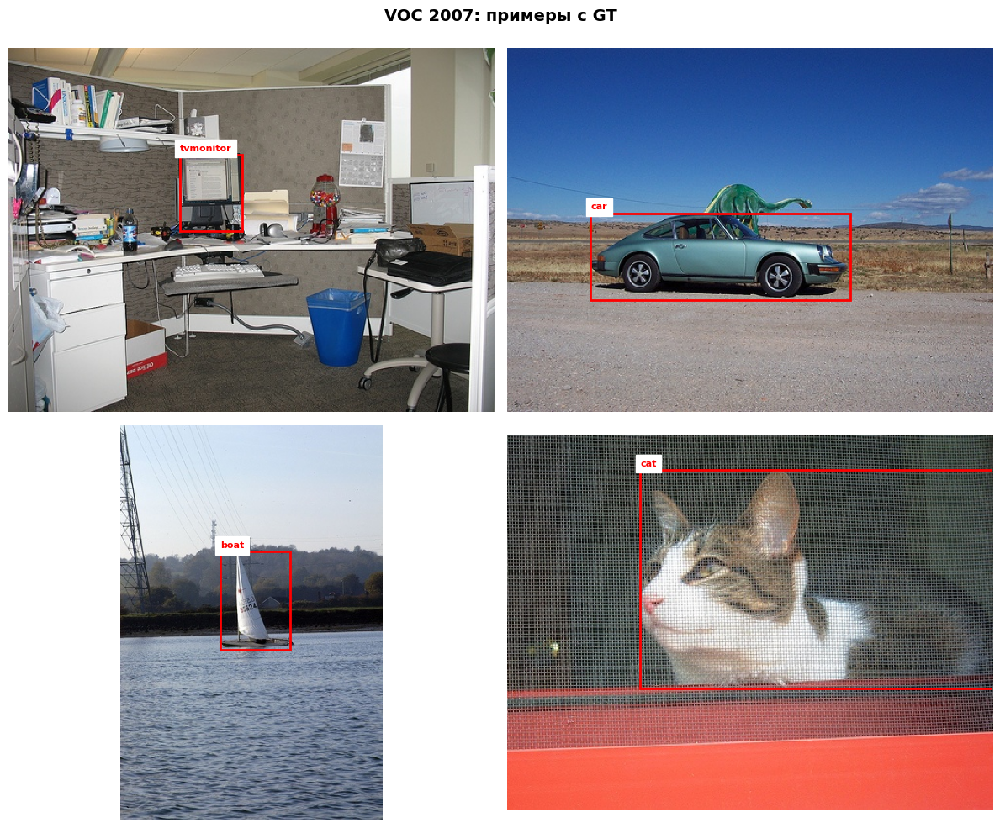

In [114]:
# Sanity check + визуализация GT
img_voc, target_voc = voc_val[0]
gt_objects = parse_voc_target(target_voc)
print(f'Image shape: {img_voc.shape}')
print(f'Объектов: {len(gt_objects)}')
for i, obj in enumerate(gt_objects[:3]):
    print(f'  {i+1}: "{obj["label"]}", bbox={obj["bbox"]}')

random.seed(SEED)
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
for i, idx in enumerate(random.sample(range(len(voc_val)), 4)):
    ax = axes.flatten()[i]
    img_t, tgt = voc_val[idx]
    ax.imshow(np.clip(img_t.permute(1, 2, 0).numpy(), 0, 1))
    for obj in parse_voc_target(tgt):
        x1, y1, x2, y2 = obj['bbox']
        ax.add_patch(mpatches.FancyBboxPatch(
            (x1, y1), x2-x1, y2-y1, linewidth=2,
            edgecolor='red', facecolor='none', boxstyle='square,pad=0'))
        ax.text(x1, y1-4, obj['label'], color='red', fontsize=8,
                fontweight='bold', backgroundcolor='white')
    ax.axis('off')
plt.suptitle('VOC 2007: примеры с GT', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

Загрузка Faster R-CNN

In [115]:
from torchvision.models.detection import (
    fasterrcnn_resnet50_fpn, FasterRCNN_ResNet50_FPN_Weights)

detector = fasterrcnn_resnet50_fpn(
    weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1)
detector = detector.to(device)
detector.eval()

print('Faster R-CNN загружен')

Faster R-CNN загружен


Детекция с порогом 0.3

In [116]:
MAX_IMAGES = 50  # Ограничение для слабого ПК

results_v1 = run_detection(
    detector, voc_val, device, score_threshold=0.3, max_images=MAX_IMAGES)
metrics_v1 = compute_det_metrics(results_v1, iou_thresh=0.5)

Инференс: 50 изображений, порог = 0.3 ...
  ... обработано 10/50
  ... обработано 20/50
  ... обработано 30/50
  ... обработано 40/50
  ... обработано 50/50
Инференс завершён. Обработано 50 изображений.
Метрики (IoU≥0.5): TP=121, FP=207, FN=15
Precision = 0.3689, Recall = 0.8897, Mean IoU = 0.8021


Визуализация сохранена: .\artifacts\figures\detection_examples.png


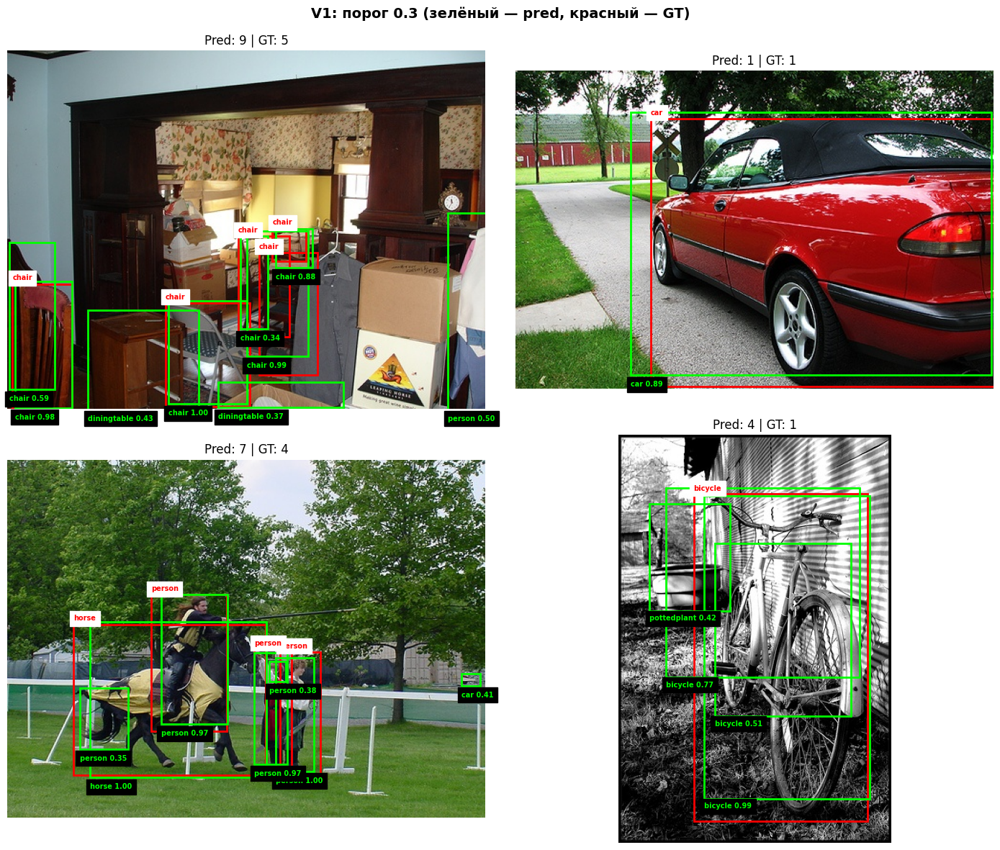

In [117]:
visualize_detections(
    results_v1, num_images=4,
    save_path=os.path.join(FIGURES_DIR, 'detection_examples.png'),
    title='V1: порог 0.3 (зелёный — pred, красный — GT)')

V2: Детекция с порогом 0.7

In [118]:
results_v2 = run_detection(
    detector, voc_val, device, score_threshold=0.7, max_images=MAX_IMAGES)
metrics_v2 = compute_det_metrics(results_v2, iou_thresh=0.5)

Инференс: 50 изображений, порог = 0.7 ...
  ... обработано 10/50
  ... обработано 20/50
  ... обработано 30/50
  ... обработано 40/50
  ... обработано 50/50
Инференс завершён. Обработано 50 изображений.
Метрики (IoU≥0.5): TP=114, FP=58, FN=22
Precision = 0.6628, Recall = 0.8382, Mean IoU = 0.8092


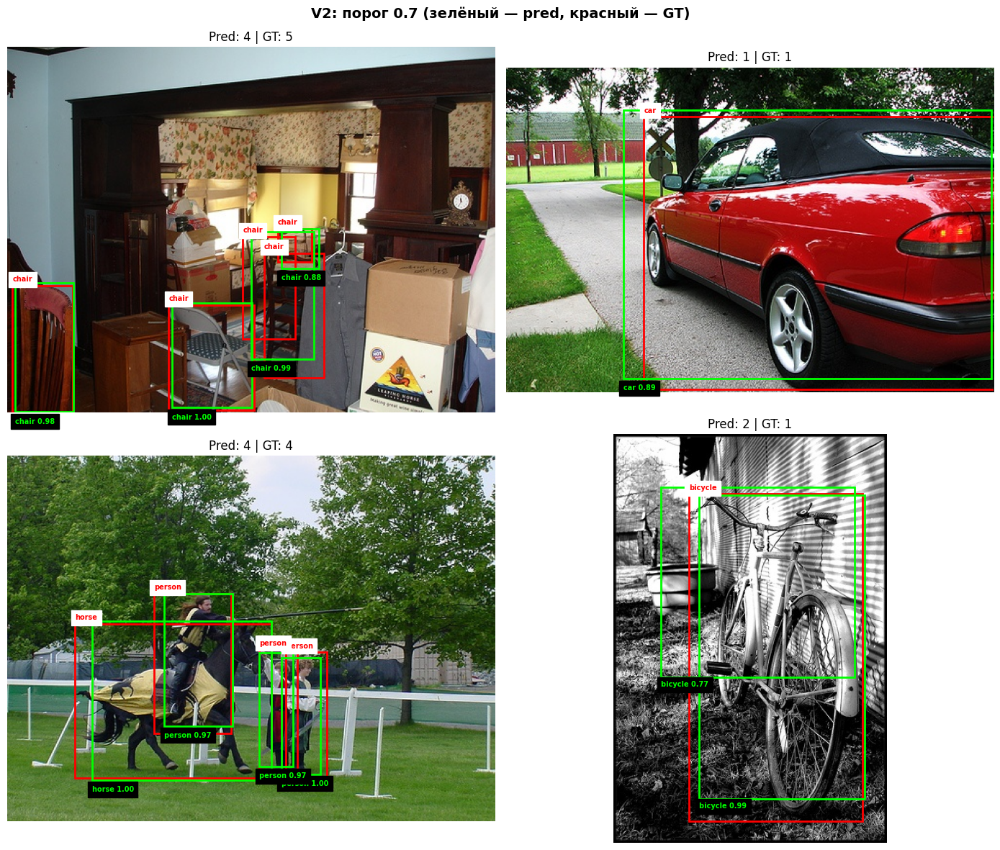

In [119]:
visualize_detections(
    results_v2, num_images=4,
    title='V2: порог 0.7 (зелёный — pred, красный — GT)')

Сравнение V1 и V2

In [120]:
print('  СРАВНЕНИЕ РЕЖИМОВ ДЕТЕКЦИИ')
print(f'{"Метрика":<15} {"V1 (порог 0.3)":>15} {"V2 (порог 0.7)":>15}')
print(f'{"Precision":<15} {metrics_v1["precision"]:>15.4f} {metrics_v2["precision"]:>15.4f}')
print(f'{"Recall":<15} {metrics_v1["recall"]:>15.4f} {metrics_v2["recall"]:>15.4f}')
print(f'{"Mean IoU":<15} {metrics_v1["mean_iou"]:>15.4f} {metrics_v2["mean_iou"]:>15.4f}')
print(f'{"TP":<15} {metrics_v1["tp"]:>15} {metrics_v2["tp"]:>15}')
print(f'{"FP":<15} {metrics_v1["fp"]:>15} {metrics_v2["fp"]:>15}')
print(f'{"FN":<15} {metrics_v1["fn"]:>15} {metrics_v2["fn"]:>15}')

print('\nИнтерпретация')
print('Низкий порог (0.3): больше объектов найдено (recall↑), но больше ложных срабатываний (precision↓)')
print('Высокий порог (0.7): меньше ошибок (precision↑), но часть объектов пропущена (recall↓)')
print('Это классический trade-off precision vs recall.')

  СРАВНЕНИЕ РЕЖИМОВ ДЕТЕКЦИИ
Метрика          V1 (порог 0.3)  V2 (порог 0.7)
Precision                0.3689          0.6628
Recall                   0.8897          0.8382
Mean IoU                 0.8021          0.8092
TP                          121             114
FP                          207              58
FN                           15              22

Интерпретация
Низкий порог (0.3): больше объектов найдено (recall↑), но больше ложных срабатываний (precision↓)
Высокий порог (0.7): меньше ошибок (precision↑), но часть объектов пропущена (recall↓)
Это классический trade-off precision vs recall.


График метрик сохранён: .\artifacts\figures\detection_metrics.png


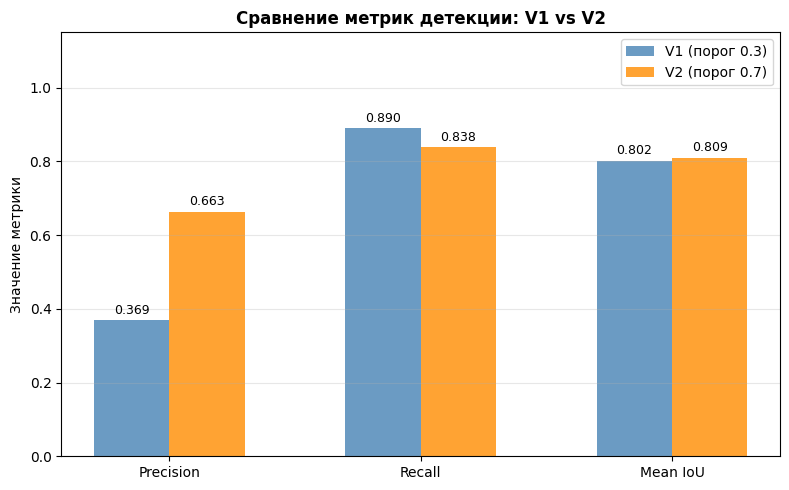

In [121]:
plot_detection_metrics(
    metrics_v1, metrics_v2,
    save_path=os.path.join(FIGURES_DIR, 'detection_metrics.png'))

Сохранение runs.csv

In [122]:
runs_path = os.path.join(ARTIFACTS_DIR, 'runs.csv')

fieldnames = [
    'experiment_id', 'task', 'dataset', 'seed',
    'model_summary', 'optimizer', 'lr', 'epochs_trained',
    'best_val_accuracy', 'test_accuracy',
    'precision', 'recall', 'mean_iou', 'notes',
]

lr_map = {'C1': 1e-3, 'C2': 1e-3, 'C3': 1e-2, 'C4': 1e-3}
rows = []

for exp_id, (name, hist) in [
    ('C1', ('SimpleCNN (base)', history_c1)),
    ('C2', ('SimpleCNN (aug)', history_c2)),
    ('C3', ('ResNet18 head-only', history_c3)),
    ('C4', ('ResNet18 finetune layer4+fc', history_c4)),
]:
    rows.append({
        'experiment_id': exp_id, 'task': 'classification', 'dataset': 'STL10',
        'seed': SEED, 'model_summary': name, 'optimizer': 'Adam',
        'lr': lr_map[exp_id], 'epochs_trained': NUM_EPOCHS,
        'best_val_accuracy': f"{hist['best_val_acc']:.4f}",
        'test_accuracy': f"{test_acc:.4f}" if exp_id == best_id else '',
        'precision': '', 'recall': '', 'mean_iou': '',
        'notes': 'best model' if exp_id == best_id else '',
    })

for exp_id, thr, met in [('V1', 0.3, metrics_v1), ('V2', 0.7, metrics_v2)]:
    rows.append({
        'experiment_id': exp_id, 'task': 'detection',
        'dataset': 'Pascal VOC 2007', 'seed': SEED,
        'model_summary': f'FasterRCNN_ResNet50_FPN (thr={thr})',
        'optimizer': '', 'lr': '', 'epochs_trained': '',
        'best_val_accuracy': '', 'test_accuracy': '',
        'precision': f"{met['precision']:.4f}",
        'recall': f"{met['recall']:.4f}",
        'mean_iou': f"{met['mean_iou']:.4f}",
        'notes': f'score_thr={thr}, iou>=0.5, {MAX_IMAGES} imgs',
    })

with open(runs_path, 'w', newline='', encoding='utf-8') as f:
    writer = csv.DictWriter(f, fieldnames=fieldnames)
    writer.writeheader()
    writer.writerows(rows)

print(f'runs.csv: {runs_path}')
for row in rows:
    print(f"  {row['experiment_id']}: {row['task']} — {row['model_summary']}")

runs.csv: .\artifacts\runs.csv
  C1: classification — SimpleCNN (base)
  C2: classification — SimpleCNN (aug)
  C3: classification — ResNet18 head-only
  C4: classification — ResNet18 finetune layer4+fc
  V1: detection — FasterRCNN_ResNet50_FPN (thr=0.3)
  V2: detection — FasterRCNN_ResNet50_FPN (thr=0.7)


## 23. Итоги

### Часть A (классификация STL10)
| Эксперимент | Модель | Описание |
|---|---|---|
| **C1** | SimpleCNN | Без аугментаций (baseline) |
| **C2** | SimpleCNN | С аугментациями (flip, rotation, jitter) |
| **C3** | ResNet18 | head-only — обучается только fc |
| **C4** | ResNet18 | fine-tune — layer4 + fc |

### Часть B (детекция Pascal VOC 2007)
| Эксперимент | Порог | Эффект |
|---|---|---|
| **V1** | 0.3 | Высокий recall, низкий precision |
| **V2** | 0.7 | Высокий precision, низкий recall |

Все артефакты сохранены в `./artifacts/`.